<a href="https://colab.research.google.com/github/RamiroIsaJ/Aprendizaje_maquina_ML/blob/main/Trabajo_final_Optimizacion_ML_RIJ.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Trabajo final - Métodos de Aprendizaje de Máquina
## Presentado por: Ramiro Isa Jara
## Fecha: Julio 2026

### Objetivo del proyecto:

- Utilizar algoritmos de Clusterización: K-Means y DBSCAN
- Utilizar Randomized Search para entrenar algoritmos de clasificación como Árboles de Decisión y Random Forest.

- Uso de un dataset del repositorio: **datasetMod1**


In [ ]:
# 1. Carga del dataset
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import os
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
import copy

os.chdir('..')

data = pd.read_excel('/content/drive/MyDrive/Aprendizaje_maquina_UTPL/Trabajos/datasetMod1.xlsx')
print('Dataset loaded succesfully: ' + str(data.shape))

Dataset loaded succesfully: (319, 33)


## Parte 1: Descripción general del Dataset

El dataset consta de 319 instancias y de 33 variables o parámetros.

### 1.1 Análisis de los parámetros del dataset

In [ ]:
data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319 entries, 0 to 318
Data columns (total 33 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Gallstone Status                                319 non-null    int64  
 1   Age                                             319 non-null    int64  
 2   Gender                                          319 non-null    int64  
 3   Comorbidity                                     319 non-null    int64  
 4   Body Mass Index (BMI)                           319 non-null    float64
 5   Total Body Water (TBW)                          319 non-null    float64
 6   Extracellular Water (ECW)                       319 non-null    float64
 7   Intracellular Water (ICW)                       319 non-null    float64
 8   Extracellular Fluid/Total Body Water (ECF/TBW)  319 non-null    float64
 9   Total Body Fat Ratio (TBFR) (%)            

In [ ]:
data.sample(10)

,Gallstone Status,Age,Gender,Comorbidity,Body Mass Index (BMI),Total Body Water (TBW),Extracellular Water (ECW),Intracellular Water (ICW),Extracellular Fluid/Total Body Water (ECF/TBW),Total Body Fat Ratio (TBFR) (%),...,High Density Lipoprotein (HDL),Triglyceride,Aspartat Aminotransferaz (AST),Alanin Aminotransferaz (ALT),Alkaline Phosphatase (ALP),Creatinine,Glomerular Filtration Rate (GFR),C-Reactive Protein (CRP),Hemoglobin (HGB),Vitamin D
293,1,65,0,1,40.9,56.9,24.5,32.4,43.00,36.90,...,45.0,76.0,22.0,20.0,69.0,0.590,107.67,4.00,16.00,11.9000
3,0,41,0,0,24.0,41.4,17.0,24.4,41.00,15.80,...,59.0,53.0,20.0,12.0,34.0,1.020,94.10,0.00,15.40,35.4000
225,1,27,0,0,21.7,45.1,17.0,28.0,37.69,13.53,...,36.0,135.0,19.0,20.0,79.0,1.120,92.30,0.00,16.30,12.0000
292,1,57,1,1,24.8,29.3,13.6,15.7,46.00,34.90,...,86.0,49.0,13.0,11.0,71.0,0.760,90.70,0.00,12.10,28.3000
17,0,34,0,0,33.0,53.2,21.4,31.8,40.00,27.40,...,40.0,105.0,17.0,23.0,48.0,0.980,103.70,0.00,16.70,35.2800
204,1,38,0,0,33.4,54.0,21.8,32.2,40.00,27.90,...,46.5,175.5,20.5,29.5,91.0,0.725,98.90,1.63,14.25,26.9000
314,1,49,0,0,28.0,47.6,20.0,28.0,42.01,24.66,...,55.0,81.0,28.0,50.0,90.0,0.980,94.50,6.20,16.50,8.3000
313,1,52,1,0,33.2,33.6,15.0,19.0,44.64,38.55,...,58.0,68.0,25.0,18.0,66.0,0.750,95.70,0.00,11.60,12.1000
299,1,59,0,0,26.6,42.1,18.2,23.9,43.00,23.30,...,44.0,98.0,17.0,16.0,92.0,1.240,66.90,0.20,14.50,36.9000
59,0,38,0,0,25.8,45.5,18.7,26.8,41.00,21.70,...,40.0,188.0,18.0,16.0,62.0,0.810,115.74,0.08,15.40,26.8625


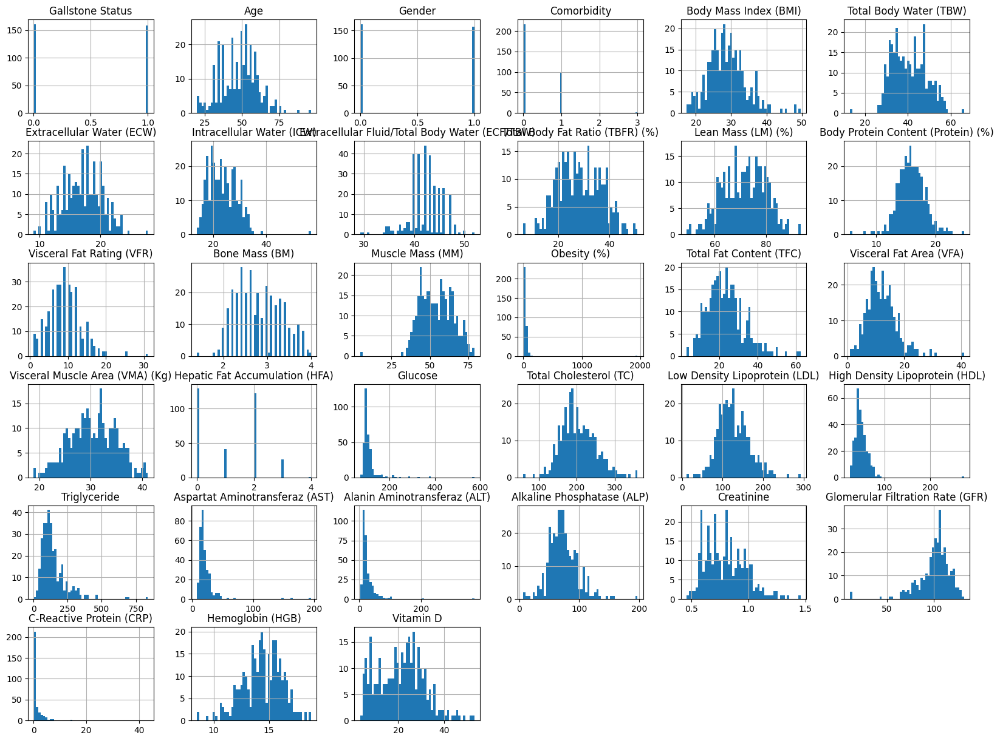

In [ ]:
# Gráfica de las variables
data.hist(bins=50, figsize=(20,15))
plt.show()

### 1.2 Conclusión de los parámetros del dataset

De acuerdo a la revisión de los datos y sus tipos se puede concluir lo siguiente:

- Los parámetros *Gallstone Status*, *Gender*, *Comorbidity* y *Hepatic Fat Accumulation (HFA)* pueden considerarse como variables **categóricas**, considerando los valores que contienen.

- El resto de parámetros del dataset son variables de tipo **numérico continuo** que pueden utilizarse como predictores para los modelos de Machine Learning.

## 1.3 Selección de las variables numéricas


In [ ]:
data_back = copy.deepcopy(data)

data_num = data_back.drop(['Gallstone Status', 'Gender', 'Comorbidity', 'Hepatic Fat Accumulation (HFA)'], axis=1)
data_num.head(10)

,Age,Body Mass Index (BMI),Total Body Water (TBW),Extracellular Water (ECW),Intracellular Water (ICW),Extracellular Fluid/Total Body Water (ECF/TBW),Total Body Fat Ratio (TBFR) (%),Lean Mass (LM) (%),Body Protein Content (Protein) (%),Visceral Fat Rating (VFR),...,High Density Lipoprotein (HDL),Triglyceride,Aspartat Aminotransferaz (AST),Alanin Aminotransferaz (ALT),Alkaline Phosphatase (ALP),Creatinine,Glomerular Filtration Rate (GFR),C-Reactive Protein (CRP),Hemoglobin (HGB),Vitamin D
0,50,27.1,52.9,21.2,31.7,40.0,19.2,80.84,18.88,9,...,40.0,134.0,20.0,22.0,87.0,0.82,112.47,0.00,16.0,33.0
1,47,30.5,43.1,19.5,23.6,45.0,32.8,67.20,16.68,15,...,43.0,103.0,14.0,13.0,46.0,0.87,107.10,0.00,14.4,25.0
2,61,31.2,47.2,20.1,27.1,43.0,27.3,72.67,16.35,15,...,43.0,69.0,18.0,14.0,66.0,1.25,65.51,0.00,16.2,30.2
3,41,24.0,41.4,17.0,24.4,41.0,15.8,84.19,16.90,6,...,59.0,53.0,20.0,12.0,34.0,1.02,94.10,0.00,15.4,35.4
4,42,28.3,51.4,20.0,31.4,39.0,20.0,80.02,16.81,8,...,30.0,326.0,27.0,54.0,71.0,0.82,112.47,0.00,16.8,40.6
5,96,20.4,34.0,15.7,18.3,46.0,6.3,93.67,18.48,12,...,30.0,65.0,13.0,13.0,60.0,1.46,43.74,0.00,11.0,45.8
6,37,19.6,41.8,17.1,24.7,41.0,11.3,88.67,19.90,3,...,40.0,60.0,15.0,14.0,72.0,0.77,118.25,0.00,13.8,20.0
7,41,36.8,57.6,23.5,34.1,41.0,31.8,68.16,12.66,16,...,34.0,464.0,26.0,28.0,69.0,1.30,73.73,0.11,16.5,24.5
8,38,27.1,51.9,20.9,31.0,40.0,21.5,78.55,17.42,8,...,33.0,679.0,68.0,102.0,70.0,0.91,110.63,1.57,16.5,22.7
9,38,23.5,39.5,16.6,22.9,42.0,19.2,80.76,17.28,6,...,43.0,129.0,19.0,34.0,75.0,0.91,110.63,0.00,16.6,15.6


## Parte 2: Aplicación de EDA para el Dataset numérico

En este paso se evaluarán los valores de correlaciones entre las variables, la multicolinealidad para eliminar los parámetros que pueden afectar la **precisión** directamente a un modelo de Machine Learning.

In [ ]:
sns.pairplot(data_num)

**Intepretación de la gráfica**

De acuerdo a la gráfica se puede notar que las variables presentan diferentes tendencias en el modelo de correlación lineal. Por tanto, se puede considerar que los datos provienen de un estudio real y es posible analizarlo estadísticamente.

### 2.1 Análisis de la distribución de los datos

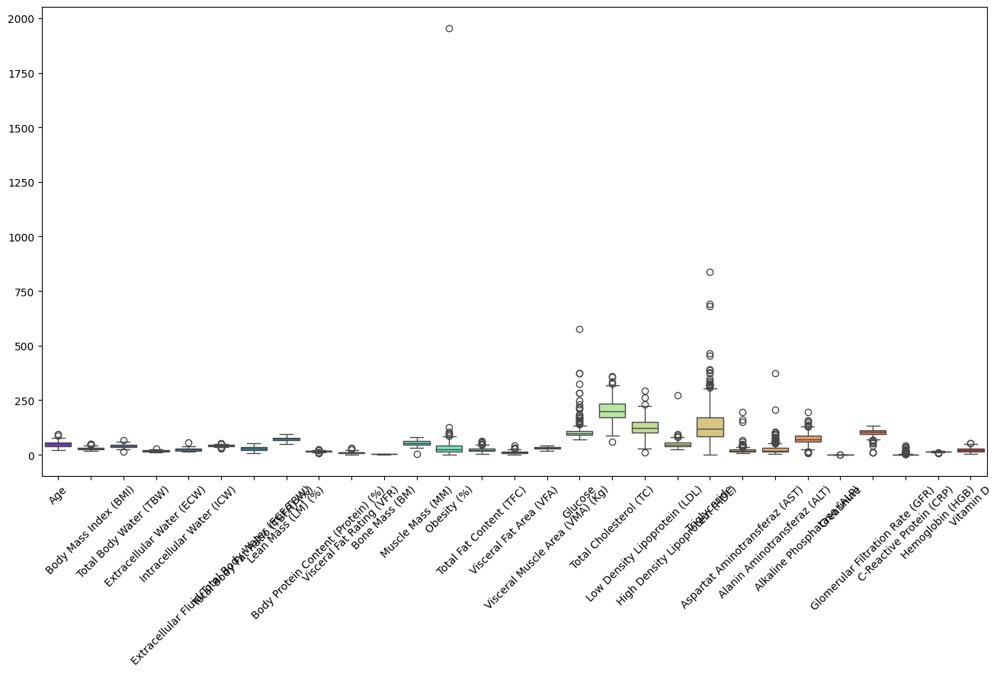

Analisis de cantidad de valores no numéricos
Age                                               0
Body Mass Index (BMI)                             0
Total Body Water (TBW)                            0
Extracellular Water (ECW)                         0
Intracellular Water (ICW)                         0
Extracellular Fluid/Total Body Water (ECF/TBW)    0
Total Body Fat Ratio (TBFR) (%)                   0
Lean Mass (LM) (%)                                0
Body Protein Content (Protein) (%)                0
Visceral Fat Rating (VFR)                         0
Bone Mass (BM)                                    0
Muscle Mass (MM)                                  0
Obesity (%)                                       0
Total Fat Content (TFC)                           0
Visceral Fat Area (VFA)                           0
Visceral Muscle Area (VMA) (Kg)                   0
Glucose                                           0
Total Cholesterol (TC)                            0
Low Density Lipopro

In [ ]:
plt.figure(figsize=(16,8))
sns.boxplot(data=data_num, palette='rainbow')
plt.xticks(rotation=45)
plt.show()

# revision de valores NAN
print('Analisis de cantidad de valores no numéricos')
print(data_num.isna().sum())

### 2.2 Tratamiento de datos atípicos

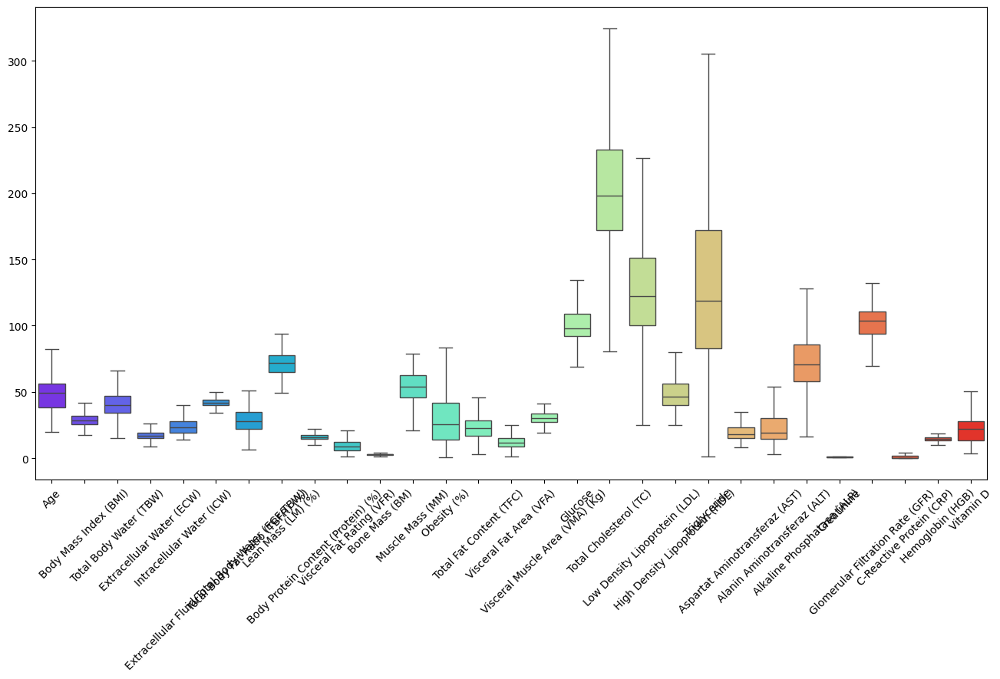

In [ ]:
# Tratamiento de datos atípicos
for col in data_num:
    Q1 = data_num[col].quantile(0.25)
    Q3 = data_num[col].quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    data_num[col] = data_num[col].clip(lower, upper)

plt.figure(figsize=(16,8))
sns.boxplot(data=data_num, palette='rainbow')
plt.xticks(rotation=45)
plt.show()

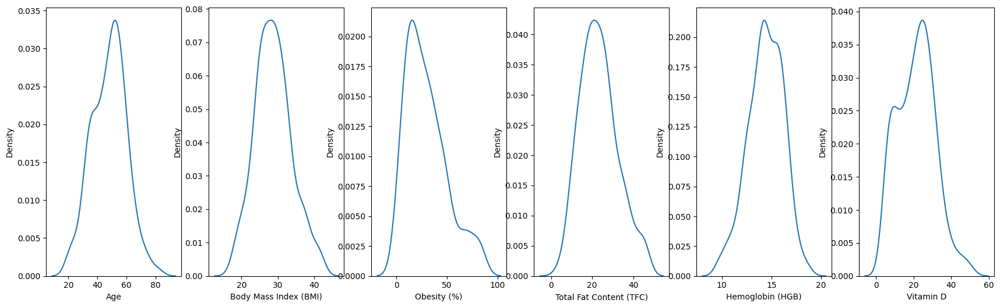

In [ ]:
# Grafico de densidad univariante
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(21, 6))

sns.kdeplot(data=data_num, x="Age", ax=axes[0])
sns.kdeplot(data=data_num, x="Body Mass Index (BMI)", ax=axes[1])
sns.kdeplot(data=data_num, x="Obesity (%)", ax=axes[2])
sns.kdeplot(data=data_num, x="Total Fat Content (TFC)", ax=axes[3])
sns.kdeplot(data=data_num, x="Hemoglobin (HGB)", ax=axes[4])
sns.kdeplot(data=data_num, x="Vitamin D", ax=axes[5])
plt.show()

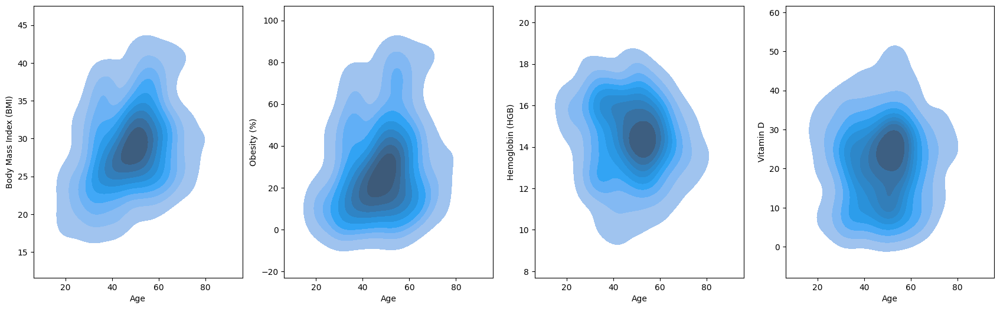

In [ ]:
# Grafico de densidad bivariante
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(21, 6))

sns.kdeplot(data=data_num, x="Age", y="Body Mass Index (BMI)", fill=True, ax=axes[0])
sns.kdeplot(data=data_num, x="Age", y="Obesity (%)", fill=True, ax=axes[1])
sns.kdeplot(data=data_num, x="Age", y="Hemoglobin (HGB)", fill=True, ax=axes[2])
sns.kdeplot(data=data_num, x="Age", y="Vitamin D", fill=True, ax=axes[3])
plt.show()

## Parte 3. Aplicación de algoritmos de clusterización

Se aplicará K-Means y DBSCAN

### 3.1 Aplicación del algoritmo K-Means al dataset numérico

In [ ]:
# Normalización de datos
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
data_num_norm = scaler.fit_transform(data_num)
data_num_norm = pd.DataFrame(data_num_norm, columns=data_num.columns)

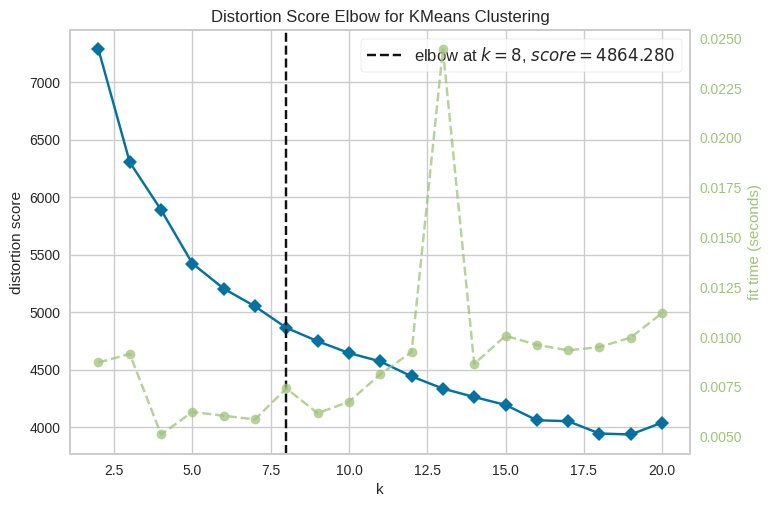

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
from sklearn.cluster import KMeans
from sklearn import metrics
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
import sklearn
import yellowbrick

vzr = KElbowVisualizer(KMeans(), k=(2, 21))
vzr.fit(data_num_norm)
vzr.poof()

In [ ]:
clusters = 8
metric_k = []
for cluster in range(2, clusters):
  cl_kmeans = KMeans(n_clusters = cluster, random_state = 42).fit(data_num_norm)
  metric_k.append(np.round(metrics.silhouette_score(data_num_norm, cl_kmeans.labels_), 3))

print(f"Silhouette Coefficient: {metric_k}")

Silhouette Coefficient: [np.float64(0.201), np.float64(0.17), np.float64(0.147), np.float64(0.131), np.float64(0.112), np.float64(0.117)]


**Interpretación de los resultados del clustering**

De acuerdo a la gráfica de *Distortion Score ELBOW* se pueden utilizar 8 grupos para evaluación de la métrica de Silhouette para evaluar que tan compactos son los agrupamientos.

Con la métrica Silhouette se puede analizar que los valores más altos obtenidos son para 2 y 3 grupos solamente.

**Esto tiene mucho sentido debido a que las variables categóricas seleccionadas anteriormente contienen clases de [0, 1] principalmente y solo alguna de ellas tiene 3 clases o más.**

In [ ]:
# con el análisis anterior el mejor valor de la metrica Solhouette es para 2 clusters
cl_kmeans = KMeans(n_clusters = 2, random_state = 42).fit(data_num_norm)
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(data_num_norm, cl_kmeans.labels_))

Silhouette Coefficient: 0.201


In [ ]:
silhouette_values_KM = metrics.silhouette_samples(data_num_norm, cl_kmeans.labels_)

means_lst1 = []
for label in range(2):
    means_lst1.append(round(silhouette_values_KM[cl_kmeans.labels_ == label].mean(), 2))
print (means_lst1)

[np.float64(0.19), np.float64(0.21)]


In [ ]:
import collections
print(collections.Counter(cl_kmeans.labels_))

Counter({np.int32(1): 160, np.int32(0): 159})


**Interpretación de los resultados de la métrica Silhouette**

Se ha seleccionado *2 clusters* para el conjunto de datos numérico normalizado, obteniendo un valor de la métrica Silhouette adecuada para cada agrupamiento.

Además, en la evaluación del número de datos que pertenecen a cada grupo, se observa que los resultados generan **un dataset balanceado** por cada grupo.

<Axes: xlabel='Total Body Water (TBW)', ylabel='High Density Lipoprotein (HDL)'>

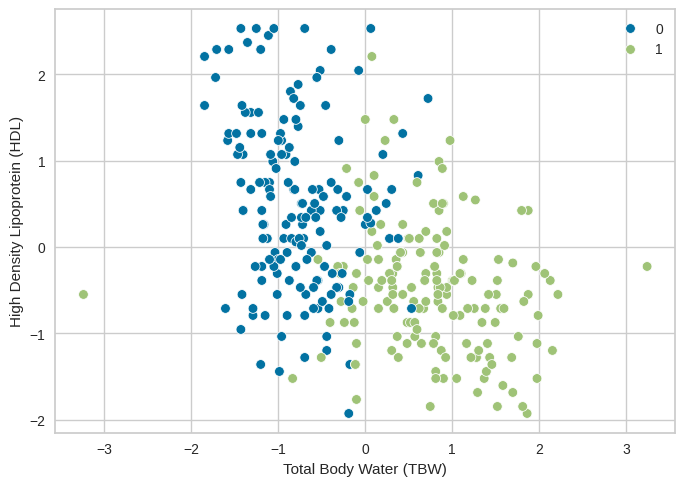

In [ ]:
sns.scatterplot(data= data_num_norm, x= data_num_norm.iloc[: , 2], y=data_num_norm.iloc[:,19], hue=cl_kmeans.labels_)

In [ ]:
data_original = copy.deepcopy(data_num)
data_original['Class'] = cl_kmeans.labels_

data_group1 = data_original.groupby(['Class']).agg(pd.Series.mean)
data_group1.head(3)

,Age,Body Mass Index (BMI),Total Body Water (TBW),Extracellular Water (ECW),Intracellular Water (ICW),Extracellular Fluid/Total Body Water (ECF/TBW),Total Body Fat Ratio (TBFR) (%),Lean Mass (LM) (%),Body Protein Content (Protein) (%),Visceral Fat Rating (VFR),...,High Density Lipoprotein (HDL),Triglyceride,Aspartat Aminotransferaz (AST),Alanin Aminotransferaz (ALT),Alkaline Phosphatase (ALP),Creatinine,Glomerular Filtration Rate (GFR),C-Reactive Protein (CRP),Hemoglobin (HGB),Vitamin D
Class,,,,,,,,,,,,,,,,,,,,,
0,49.157233,29.383648,34.542138,14.849057,19.545283,43.148082,33.560314,66.335472,15.038978,7.660377,...,54.947799,117.265346,17.597484,17.837264,72.467925,0.686258,102.205679,1.225393,13.162264,20.443134
1,46.871875,28.206563,46.608125,19.270000,27.590781,41.345734,23.022687,76.907875,16.854891,10.375000,...,42.643750,158.387500,22.146875,29.967188,72.890625,0.913312,101.017216,0.793047,15.681875,22.329010


**Interpretación de los grupos**

De acuerdo a la tabla anterior, se muestran los centroides de los 2 agrupamientos obtenidos con el algoritmos K-Means.

Las variables que presentan una diferencia significativa en el agrupamiento son: *Intracellular Water (ICW), Total Body Fat Ratio (TBFR) (%), Lean Mass (LM) (%), Triglyceride, Alanin Aminotransferaz (ALT), C-Reactive Protein (CRP)* con valores diferentes en un **30%** aproximadamente, lo que hace que se diferencien los 2 grupos.

### 3.2 Aplicación del algoritmo DBSCAN al dataset numérico

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.cluster import DBSCAN
from sklearn import metrics


In [ ]:
eps = [1.5, 2.5, 3, 3.5, 4, 4.5, 5, 5.5]
min_samples =  [5, 10, 15, 20, 25, 30]

for i in range(len(eps)):
  for j in range(len(min_samples)):
    cl_DBSCAN = DBSCAN(eps=eps[i], min_samples=min_samples[j]).fit(data_num_norm)
    unique_labels = set(cl_DBSCAN.labels_)
    num_clusters = len(unique_labels) - (1 if -1 in unique_labels else 0)
    print(f"Número de grupos: {num_clusters} con eps: {eps[i]} y num_samples: {min_samples[j]}")
    if num_clusters >= 2:
      print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(data_num_norm, cl_DBSCAN.labels_))

Número de grupos: 0 con eps: 1.5 y num_samples: 5
Número de grupos: 0 con eps: 1.5 y num_samples: 10
Número de grupos: 0 con eps: 1.5 y num_samples: 15
Número de grupos: 0 con eps: 1.5 y num_samples: 20
Número de grupos: 0 con eps: 1.5 y num_samples: 25
Número de grupos: 0 con eps: 1.5 y num_samples: 30
Número de grupos: 2 con eps: 2.5 y num_samples: 5
Silhouette Coefficient: -0.214
Número de grupos: 0 con eps: 2.5 y num_samples: 10
Número de grupos: 0 con eps: 2.5 y num_samples: 15
Número de grupos: 0 con eps: 2.5 y num_samples: 20
Número de grupos: 0 con eps: 2.5 y num_samples: 25
Número de grupos: 0 con eps: 2.5 y num_samples: 30
Número de grupos: 2 con eps: 3 y num_samples: 5
Silhouette Coefficient: -0.103
Número de grupos: 2 con eps: 3 y num_samples: 10
Silhouette Coefficient: -0.185
Número de grupos: 0 con eps: 3 y num_samples: 15
Número de grupos: 0 con eps: 3 y num_samples: 20
Número de grupos: 0 con eps: 3 y num_samples: 25
Número de grupos: 0 con eps: 3 y num_samples: 30
Núme

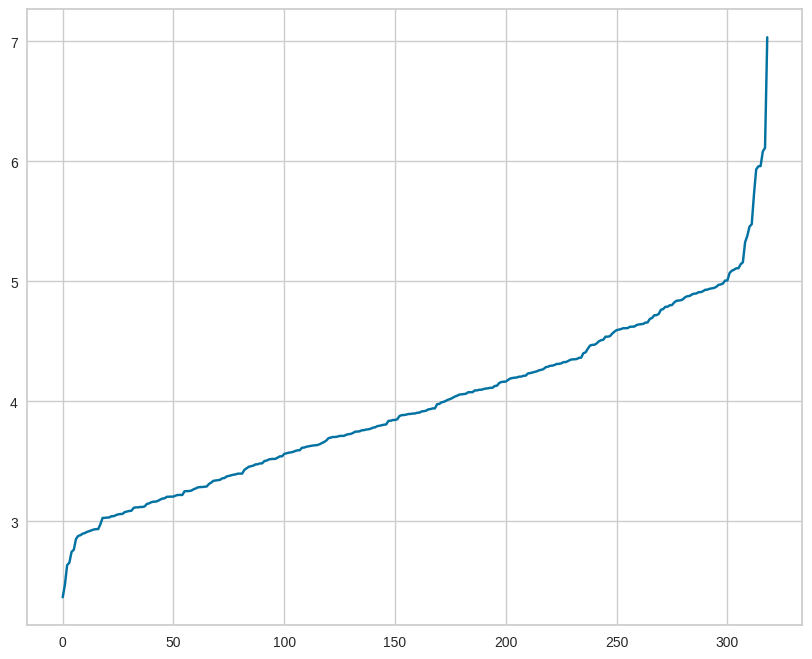

In [ ]:
from sklearn.neighbors import NearestNeighbors

nn = NearestNeighbors(n_neighbors=10).fit(data_num_norm)
distances, indices = nn.kneighbors(data_num_norm)

distances = np.sort(distances, axis=0)
distances = distances[:,4]
plt.figure(figsize=(10,8))
plt.plot(distances)

**Interpretación de los resultados anteriores**

Se han realizado varias pruebas para el algoritomo DBSCAN con distintos valores para el parámetro **eps** y **min_samples**. Los resultados obtenidos no son buenos analizando la métrica Silhouette.

El mejor resultados obtenido es la combinación de $eps = 3.5$ y $min\_samples = 10$ para obtener una métrica cercana a $0$. Que indicaría la presencia de 2 grupos pero los datos están en el límite de los agrupamientos, es decir, no hay grupos totalmente compactos.

In [ ]:
cl_DBSCAN = DBSCAN(eps=3.5, min_samples=10).fit(data_num_norm)

print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(data_num_norm, cl_DBSCAN.labels_))

Silhouette Coefficient: -0.016


In [ ]:
silhouette_values_DBSCAN = metrics.silhouette_samples(data_num_norm, cl_DBSCAN.labels_)

means_lst2 = []
for label in range(2):
   means_lst2.append(round(silhouette_values_DBSCAN[cl_DBSCAN.labels_ == label].mean(), 2))
print (means_lst2)

[np.float64(0.26), np.float64(0.29)]


In [ ]:
print (collections.Counter(cl_DBSCAN.labels_))

Counter({np.int64(-1): 200, np.int64(0): 61, np.int64(1): 58})


**Interpretación de los resultados de la métrica Silhouette**

Analizando la métrica Silhouette para los *2 clusters* para el conjunto de datos numérico normalizado, se obtienen valores positivos lo que indica que los 2 grupos tiene una alta compactación.

Además, en la evaluación del número de datos que pertenecen a cada grupo, se observa que los resultados generan **un dataset balanceado** por los grupos de la clase $0$ y $1$. Mientas que, el grupo considerado como ruido $(-1)$ agrupa la mayor cantidad de datos.

<Axes: xlabel='Total Body Water (TBW)', ylabel='High Density Lipoprotein (HDL)'>

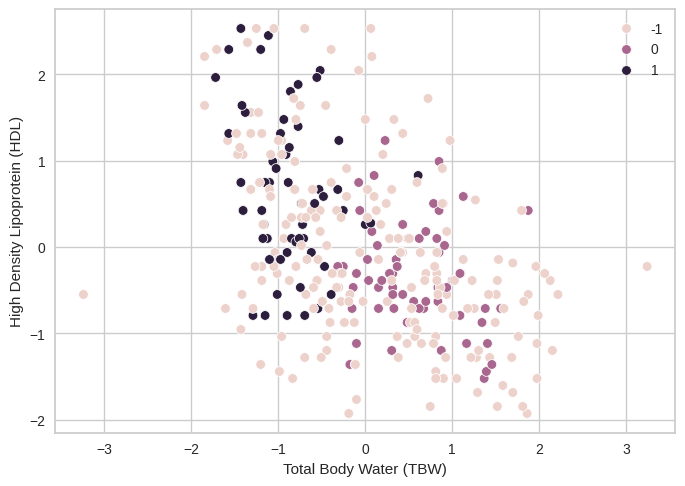

In [ ]:
sns.scatterplot(data= data_num_norm, x= data_num_norm.iloc[: , 2], y=data_num_norm.iloc[:,19], hue=cl_DBSCAN.labels_)

In [ ]:
data_original2 = copy.deepcopy(data_num)
data_original2['Class'] = cl_DBSCAN.labels_

data_group2 = data_original2.groupby(['Class']).agg(pd.Series.mean)
data_group2.head(3)

,Age,Body Mass Index (BMI),Total Body Water (TBW),Extracellular Water (ECW),Intracellular Water (ICW),Extracellular Fluid/Total Body Water (ECF/TBW),Total Body Fat Ratio (TBFR) (%),Lean Mass (LM) (%),Body Protein Content (Protein) (%),Visceral Fat Rating (VFR),...,High Density Lipoprotein (HDL),Triglyceride,Aspartat Aminotransferaz (AST),Alanin Aminotransferaz (ALT),Alkaline Phosphatase (ALP),Creatinine,Glomerular Filtration Rate (GFR),C-Reactive Protein (CRP),Hemoglobin (HGB),Vitamin D
Class,,,,,,,,,,,,,,,,,,,,,
-1,49.527500,29.936750,41.193500,17.230500,24.121625,41.892513,29.431000,70.450850,15.908150,9.950000,...,47.665000,149.532500,20.512500,26.035625,73.880000,0.803200,99.621412,1.305387,14.380000,20.732692
0,43.540984,26.362295,45.154098,18.626230,26.519672,41.376230,20.828852,79.096557,17.092295,8.409836,...,44.491803,135.926230,19.852459,24.758197,71.393443,0.929836,103.306093,0.403033,15.821311,22.758331
1,47.482759,27.406897,33.731034,14.860345,18.624138,44.369138,32.120000,67.888621,14.891724,6.465517,...,57.115517,99.813621,17.724138,15.750000,69.894828,0.653190,106.681092,0.621767,13.117241,22.212126


**Interpretación de los grupos**

De acuerdo a la tabla anterior, se muestran los centroides de los 3 agrupamientos obtenidos con el algoritmos DBSCAN.

Las variables que presentan una diferencia significativa en el agrupamiento son: *Total Body Water (TBW), Intracellular Water (ICW), Lean Mass (LM) (%), High Density Lipoprotein (HDL), Creatinine, C-Reactive Protein (CRP)* con valores diferentes en un **25%** aproximadamente, lo que hace que se diferencien los 2 grupos principales y el grupo considerado ruido.

Algunas de las variables mencionadas anteriormente, también se relacionan con las que se diferencian por el algoritmo K-Means.

## Parte 4. Aplicación de algoritmos de clasificación

Se aplicará Decision-Tree y Random Forest

### 4.1 Feature Engineering

Analizar si las variables dependientes `y` como *'Gallstone Status', 'Gender', 'Comorbidity', 'Hepatic Fat Accumulation (HFA)'* tiene relaciones lineales altas con algunas variables independientes o predictoras.

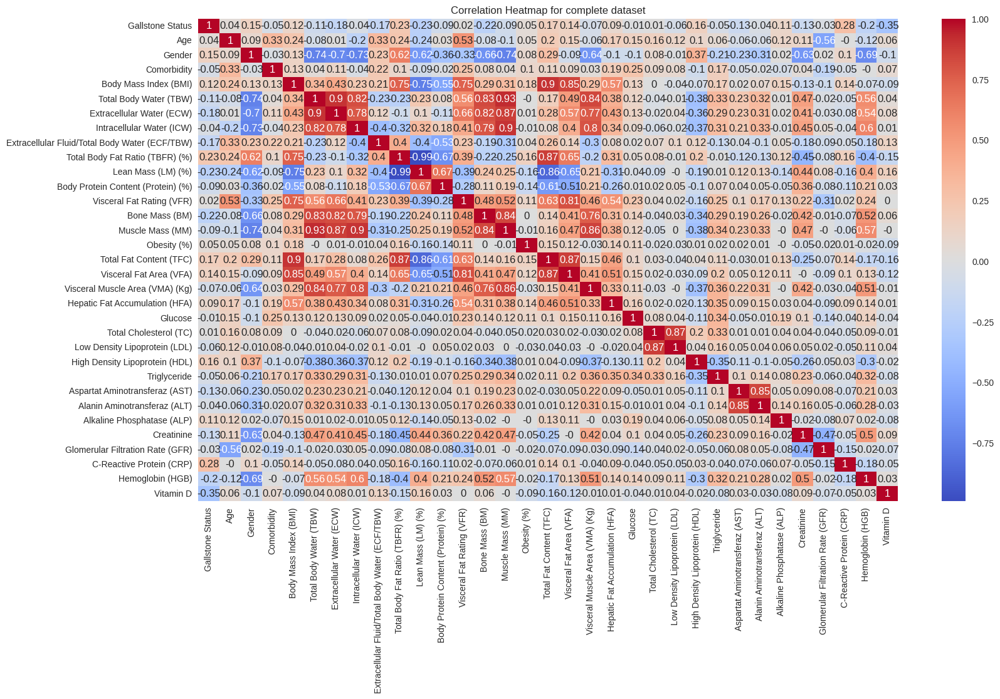

In [ ]:
np.random.seed(42)

corr_matrix = np.round(data.corr(), 2)
plt.figure(figsize=(18, 10))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap for complete dataset")
plt.show()

In [ ]:
# Analisis de correlaciones con la variable a predicir 'Hepatic Fat Accumulation (HFA)'
correlation1 = data.corr(); correlation1['Gallstone Status']

,Gallstone Status
Gallstone Status,1.000000
Age,0.036339
Gender,0.153483
Comorbidity,-0.048516
Body Mass Index (BMI),0.121507
Total Body Water (TBW),-0.111233
Extracellular Water (ECW),-0.178436
Intracellular Water (ICW),-0.035274
Extracellular Fluid/Total Body Water (ECF/TBW),-0.169826
Total Body Fat Ratio (TBFR) (%),0.225470


## Verificar la correlación en el rango (-0.1, 0.1)

In [ ]:
correlation1['Gallstone Status'][(correlation1['Gallstone Status'].abs() >= -0.1) & (correlation1['Gallstone Status'].abs() <= 0.1)]

,Gallstone Status
Age,0.036339
Comorbidity,-0.048516
Intracellular Water (ICW),-0.035274
Body Protein Content (Protein) (%),-0.086424
Visceral Fat Rating (VFR),0.018288
Muscle Mass (MM),-0.093297
Obesity (%),0.053920
Visceral Muscle Area (VMA) (Kg),-0.072989
Hepatic Fat Accumulation (HFA),0.090268
Glucose,-0.011498


## Eliminación de parámetros predictivos en base al análisis de correlaciones

In [ ]:
X_previo = copy.deepcopy(data)

X_previo = X_previo.drop(columns=['Age', 'Gender', 'Comorbidity', 'Intracellular Water (ICW)',
                                  'Body Protein Content (Protein) (%)', 'Visceral Fat Rating (VFR)',
                                  'Muscle Mass (MM)', 'Obesity (%)', 'Visceral Muscle Area (VMA) (Kg)', 'Hepatic Fat Accumulation (HFA)',
                                  'Glucose', 'Total Cholesterol (TC)', 'Low Density Lipoprotein (LDL)', 'Triglyceride', 'Alanin Aminotransferaz (ALT)',
                                  'Glomerular Filtration Rate (GFR)'])
X_previo.head()

,Gallstone Status,Body Mass Index (BMI),Total Body Water (TBW),Extracellular Water (ECW),Extracellular Fluid/Total Body Water (ECF/TBW),Total Body Fat Ratio (TBFR) (%),Lean Mass (LM) (%),Bone Mass (BM),Total Fat Content (TFC),Visceral Fat Area (VFA),High Density Lipoprotein (HDL),Aspartat Aminotransferaz (AST),Alkaline Phosphatase (ALP),Creatinine,C-Reactive Protein (CRP),Hemoglobin (HGB),Vitamin D
0,0,27.1,52.9,21.2,40.0,19.2,80.84,3.7,17.8,10.6,40.0,20.0,87.0,0.82,0.0,16.0,33.0
1,0,30.5,43.1,19.5,45.0,32.8,67.20,3.2,31.0,18.4,43.0,14.0,46.0,0.87,0.0,14.4,25.0
2,0,31.2,47.2,20.1,43.0,27.3,72.67,3.3,24.9,16.2,43.0,18.0,66.0,1.25,0.0,16.2,30.2
3,0,24.0,41.4,17.0,41.0,15.8,84.19,2.9,10.7,6.5,59.0,20.0,34.0,1.02,0.0,15.4,35.4
4,0,28.3,51.4,20.0,39.0,20.0,80.02,3.5,17.9,10.4,30.0,27.0,71.0,0.82,0.0,16.8,40.6


## Definición de las variables predictoras $X$ y la variable $y$ a predecir Hepatic Fat Accumulation (HFA)

In [ ]:
dataf = copy.deepcopy(X_previo)

# variables predictoras
X1 = dataf.drop('Gallstone Status', axis=1)
print(X1.head())


   Body Mass Index (BMI)  Total Body Water (TBW)  Extracellular Water (ECW)  \
0                   27.1                    52.9                       21.2   
1                   30.5                    43.1                       19.5   
2                   31.2                    47.2                       20.1   
3                   24.0                    41.4                       17.0   
4                   28.3                    51.4                       20.0   

   Extracellular Fluid/Total Body Water (ECF/TBW)  \
0                                            40.0   
1                                            45.0   
2                                            43.0   
3                                            41.0   
4                                            39.0   

   Total Body Fat Ratio (TBFR) (%)  Lean Mass (LM) (%)  Bone Mass (BM)  \
0                             19.2               80.84             3.7   
1                             32.8               67.20    

In [ ]:
# Tratamiento de datos atípicos
for col in X1:
    Q1 = X1[col].quantile(0.25)
    Q3 = X1[col].quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    X1[col] = X1[col].clip(lower, upper)

In [ ]:
# variable a predicir
from pandas.api.types import CategoricalDtype

explicit_type = CategoricalDtype(categories=[0, 1], ordered=False)

y = X_previo[['Gallstone Status']].astype(explicit_type)
print(y.describe())
print('Analisis de cantidad de valores no numéricos')
print(y.isna().sum(), type(y))

        Gallstone Status
count                319
unique                 2
top                    0
freq                 161
Analisis de cantidad de valores no numéricos
Gallstone Status    0
dtype: int64 <class 'pandas.core.frame.DataFrame'>


## Analisis de Multicolinealidad

Se usa el método de VIF (variance_inflaction_factor)

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vifF1 = pd.DataFrame()

vifF1["features"] = X1.columns
vifF1["vif_Factor"] = [variance_inflation_factor(X1, i) for i in range(X1.shape[1])]
print(vifF1)

                                          features  vif_Factor
0                            Body Mass Index (BMI)  284.701878
1                           Total Body Water (TBW)  461.684019
2                        Extracellular Water (ECW)  888.932325
3   Extracellular Fluid/Total Body Water (ECF/TBW)  937.457888
4                  Total Body Fat Ratio (TBFR) (%)  356.369461
5                               Lean Mass (LM) (%)  488.242554
6                                   Bone Mass (BM)  131.832110
7                          Total Fat Content (TFC)  111.076772
8                          Visceral Fat Area (VFA)   99.904009
9                   High Density Lipoprotein (HDL)   24.542908
10                  Aspartat Aminotransferaz (AST)   11.801978
11                      Alkaline Phosphatase (ALP)   12.373551
12                                      Creatinine   37.322167
13                        C-Reactive Protein (CRP)    1.845854
14                                Hemoglobin (HGB)  141

In [ ]:
#  Calcular the VIF con eliminación de features

vifF2 = pd.DataFrame()

x_DF2 = X1.drop('Extracellular Fluid/Total Body Water (ECF/TBW)', axis=1)
x_DF2.head()

vifF2["features"] = x_DF2.columns
vifF2["vif_Factor"] = [variance_inflation_factor(x_DF2.values, i) for i in range(x_DF2.shape[1])]
print(vifF2)

                           features  vif_Factor
0             Body Mass Index (BMI)  268.179914
1            Total Body Water (TBW)  266.712381
2         Extracellular Water (ECW)  238.206390
3   Total Body Fat Ratio (TBFR) (%)  133.846911
4                Lean Mass (LM) (%)  241.200373
5                    Bone Mass (BM)  120.280796
6           Total Fat Content (TFC)  110.760956
7           Visceral Fat Area (VFA)   82.508241
8    High Density Lipoprotein (HDL)   24.486855
9    Aspartat Aminotransferaz (AST)   11.763761
10       Alkaline Phosphatase (ALP)   12.161899
11                       Creatinine   36.824599
12         C-Reactive Protein (CRP)    1.836019
13                 Hemoglobin (HGB)  141.389553
14                        Vitamin D    6.257629


In [ ]:
x_DF2 = x_DF2.drop('Body Mass Index (BMI)', axis=1)
x_DF2.head()

vifF2 = pd.DataFrame()
vifF2["features"] = x_DF2.columns
vifF2["vif_Factor"] = [variance_inflation_factor(x_DF2.values, i) for i in range(x_DF2.shape[1])]
print(vifF2)

                           features  vif_Factor
0            Total Body Water (TBW)  253.398957
1         Extracellular Water (ECW)  232.243404
2   Total Body Fat Ratio (TBFR) (%)   93.621367
3                Lean Mass (LM) (%)  238.921310
4                    Bone Mass (BM)  118.855820
5           Total Fat Content (TFC)   99.893005
6           Visceral Fat Area (VFA)   81.070463
7    High Density Lipoprotein (HDL)   23.878609
8    Aspartat Aminotransferaz (AST)   11.753853
9        Alkaline Phosphatase (ALP)   12.053946
10                       Creatinine   36.772928
11         C-Reactive Protein (CRP)    1.793870
12                 Hemoglobin (HGB)  140.844521
13                        Vitamin D    6.221476


In [ ]:
x_DF2 = x_DF2.drop('Total Body Water (TBW)', axis=1)
x_DF2.head()

vifF2 = pd.DataFrame()
vifF2["features"] = x_DF2.columns
vifF2["vif_Factor"] = [variance_inflation_factor(x_DF2.values, i) for i in range(x_DF2.shape[1])]
print(vifF2)

                           features  vif_Factor
0         Extracellular Water (ECW)  168.928185
1   Total Body Fat Ratio (TBFR) (%)   83.273124
2                Lean Mass (LM) (%)  208.916053
3                    Bone Mass (BM)  112.270039
4           Total Fat Content (TFC)   99.006037
5           Visceral Fat Area (VFA)   71.366552
6    High Density Lipoprotein (HDL)   23.631367
7    Aspartat Aminotransferaz (AST)   11.721733
8        Alkaline Phosphatase (ALP)   12.051925
9                        Creatinine   36.726825
10         C-Reactive Protein (CRP)    1.746601
11                 Hemoglobin (HGB)  140.316270
12                        Vitamin D    6.207458


In [ ]:
x_DF2 = x_DF2.drop('Lean Mass (LM) (%)', axis=1)
x_DF2.head()

vifF2 = pd.DataFrame()
vifF2["features"] = x_DF2.columns
vifF2["vif_Factor"] = [variance_inflation_factor(x_DF2.values, i) for i in range(x_DF2.shape[1])]
print(vifF2)

                           features  vif_Factor
0         Extracellular Water (ECW)  152.063625
1   Total Body Fat Ratio (TBFR) (%)   80.710914
2                    Bone Mass (BM)  101.778431
3           Total Fat Content (TFC)   97.985066
4           Visceral Fat Area (VFA)   51.113710
5    High Density Lipoprotein (HDL)   19.081211
6    Aspartat Aminotransferaz (AST)   11.719412
7        Alkaline Phosphatase (ALP)   11.791232
8                        Creatinine   34.038249
9          C-Reactive Protein (CRP)    1.741988
10                 Hemoglobin (HGB)  100.807509
11                        Vitamin D    6.170288


In [ ]:
x_DF2 = x_DF2.drop('Extracellular Water (ECW)', axis=1)
x_DF2.head()

vifF2 = pd.DataFrame()
vifF2["features"] = x_DF2.columns
vifF2["vif_Factor"] = [variance_inflation_factor(x_DF2.values, i) for i in range(x_DF2.shape[1])]
print(vifF2)

                           features  vif_Factor
0   Total Body Fat Ratio (TBFR) (%)   76.641298
1                    Bone Mass (BM)   65.091339
2           Total Fat Content (TFC)   96.527582
3           Visceral Fat Area (VFA)   46.424586
4    High Density Lipoprotein (HDL)   19.076813
5    Aspartat Aminotransferaz (AST)   11.281586
6        Alkaline Phosphatase (ALP)   11.746689
7                        Creatinine   33.456930
8          C-Reactive Protein (CRP)    1.738964
9                  Hemoglobin (HGB)   92.162582
10                        Vitamin D    5.946510


## Obtención del dataset final para el modelo de Machine Learning

In [ ]:
X_final = X1.drop(columns=['Extracellular Fluid/Total Body Water (ECF/TBW)', 'Body Mass Index (BMI)',
                           'Total Body Water (TBW)', 'Lean Mass (LM) (%)', 'Extracellular Water (ECW)'])
X_final.head()

,Total Body Fat Ratio (TBFR) (%),Bone Mass (BM),Total Fat Content (TFC),Visceral Fat Area (VFA),High Density Lipoprotein (HDL),Aspartat Aminotransferaz (AST),Alkaline Phosphatase (ALP),Creatinine,C-Reactive Protein (CRP),Hemoglobin (HGB),Vitamin D
0,19.2,3.7,17.8,10.6,40.0,20.0,87.0,0.82,0.0,16.0,33.0
1,32.8,3.2,31.0,18.4,43.0,14.0,46.0,0.87,0.0,14.4,25.0
2,27.3,3.3,24.9,16.2,43.0,18.0,66.0,1.25,0.0,16.2,30.2
3,15.8,2.9,10.7,6.5,59.0,20.0,34.0,1.02,0.0,15.4,35.4
4,20.0,3.5,17.9,10.4,30.0,27.0,71.0,0.82,0.0,16.8,40.6


In [ ]:
# Normalización de datos
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_norm = scaler.fit_transform(X_final)
X_norm = pd.DataFrame(X_norm, columns=X_final.columns)
X_norm.head()

,Total Body Fat Ratio (TBFR) (%),Bone Mass (BM),Total Fat Content (TFC),Visceral Fat Area (VFA),High Density Lipoprotein (HDL),Aspartat Aminotransferaz (AST),Alkaline Phosphatase (ALP),Creatinine,C-Reactive Protein (CRP),Hemoglobin (HGB),Vitamin D
0,-1.076361,1.762856,-0.607336,-0.300308,-0.711573,0.017708,0.639624,0.113750,-0.723002,0.899537,1.169448
1,0.536701,0.779897,0.843468,1.296280,-0.468342,-0.862617,-1.191693,0.400144,-0.723002,-0.014870,0.363694
2,-0.115640,0.976489,0.173021,0.845960,-0.468342,-0.275734,-0.298368,2.576743,-0.723002,1.013838,0.887434
3,-1.479627,0.190121,-1.387692,-1.139541,0.828894,0.017708,-1.727689,1.259328,-0.723002,0.556634,1.411174
4,-0.981475,1.369672,-0.596345,-0.341247,-1.522346,1.044753,-0.075037,0.113750,-0.723002,1.356740,1.934913


### División del conjunto de entrenamiento y prueba

In [ ]:
from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X_norm, y, test_size=0.2, random_state=42, shuffle=True)


### Balanceo de datos

In [ ]:
from imblearn.over_sampling import SMOTE
from collections import Counter

over_sampler = SMOTE(k_neighbors=2)
train_XB, train_YB = over_sampler.fit_resample(train_X, train_Y)
print(f"Training target statistics: {train_YB.value_counts()}")

Training target statistics: Gallstone Status
0                   128
1                   128
Name: count, dtype: int64


### 4.2 Arboles de decisión

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
dtree_model = DecisionTreeClassifier(random_state=42)

param_RSgrid = {
    'max_depth': [2, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50],
    'criterion': ['gini', 'entropy']
}
random_search_trees = RandomizedSearchCV(dtree_model, param_RSgrid, cv=5, return_train_score=False).fit(train_XB, train_YB)

### Evaluación de los modelos entrenados y selección del mejor modelo

In [ ]:
cvresRSGrid = random_search_trees.cv_results_
for mean_score, params in zip(cvresRSGrid["mean_test_score"], cvresRSGrid["params"]):
    print(mean_score, params)

# print best parameter after tuning
print(random_search_trees.best_params_)

print(random_search_trees.best_score_)

print(random_search_trees.best_estimator_)

0.6717948717948719 {'max_depth': 15, 'criterion': 'entropy'}
0.6717948717948719 {'max_depth': 40, 'criterion': 'entropy'}
0.7305429864253392 {'max_depth': 2, 'criterion': 'gini'}
0.6717948717948719 {'max_depth': 20, 'criterion': 'entropy'}
0.6601809954751131 {'max_depth': 15, 'criterion': 'gini'}
0.6717948717948719 {'max_depth': 45, 'criterion': 'entropy'}
0.6601809954751131 {'max_depth': 35, 'criterion': 'gini'}
0.6601809954751131 {'max_depth': 30, 'criterion': 'gini'}
0.6601809954751131 {'max_depth': 40, 'criterion': 'gini'}
0.6601809954751131 {'max_depth': 10, 'criterion': 'gini'}
{'max_depth': 2, 'criterion': 'gini'}
0.7305429864253392
DecisionTreeClassifier(max_depth=2, random_state=42)


In [ ]:
# Selección del mejor modelo
best_model_tree = random_search_trees.best_estimator_

predict_Y = best_model_tree.predict(test_X)
print(confusion_matrix(test_Y, predict_Y))
print(classification_report(test_Y, predict_Y))

[[25  8]
 [ 8 23]]
              precision    recall  f1-score   support

           0       0.76      0.76      0.76        33
           1       0.74      0.74      0.74        31

    accuracy                           0.75        64
   macro avg       0.75      0.75      0.75        64
weighted avg       0.75      0.75      0.75        64



Text(70.72222222222221, 0.5, 'Real values')

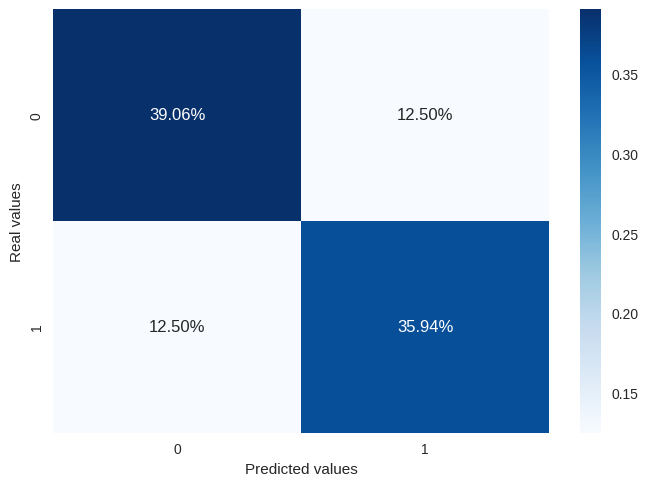

In [ ]:
matrix = confusion_matrix(predict_Y, test_Y)
ax = sns.heatmap(matrix/np.sum(matrix), annot=True, fmt='.2%', cmap='Blues')
ax.set_xlabel('Predicted values')
ax.set_ylabel('Real values')

**Conclusión a partir de los resultados de Árboles de decisión**

De acuerdo a los resultados, el algoritmo presenta un F1-score de $0.76$ para la $clase 0$ y de $0.74$ para la $clase 1$. Estas clases indican la presencia o no de cálculos biliares.

Los scores obtenidos, muestran un rendimiento aceptable del modelo, con el dataset utilizado, ya que muestran una diferencia cercana al $9\%$ del valor de $0.80$ esperado para la generalización del modelo.

### 4.3 Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier()

param_RSgrid_rf = {
    'n_estimators': np.arange(50, 500, 50),
    'max_depth': [None, 10, 20, 30, 40],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None],
    'bootstrap': [True, False]
}
random_search_rf = RandomizedSearchCV(rf_model, param_RSgrid_rf, cv=5, return_train_score=False).fit(train_XB, train_YB.values.ravel())

In [ ]:
cvresRSGridrf = random_search_rf.cv_results_
for mean_score, params in zip(cvresRSGridrf["mean_test_score"], cvresRSGridrf["params"]):
    print(mean_score, params)

# print best parameter after tuning
print(random_search_rf.best_params_)

print(random_search_rf.best_score_)

print(random_search_rf.best_estimator_)

0.7463046757164404 {'n_estimators': np.int64(250), 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 30, 'bootstrap': False}
0.652262443438914 {'n_estimators': np.int64(100), 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': 10, 'bootstrap': False}
0.7500754147812971 {'n_estimators': np.int64(100), 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_depth': 30, 'bootstrap': False}
0.761764705882353 {'n_estimators': np.int64(450), 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 10, 'bootstrap': True}
0.6797134238310708 {'n_estimators': np.int64(200), 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': 10, 'bootstrap': False}
0.7070135746606334 {'n_estimators': np.int64(400), 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': None, 'max_depth': None, 'bootstrap': False}
0.6952488687782805 {'n_estimators': np.int64(300), '

In [ ]:
# Selección del mejor modelo de Random Forest
best_model_rf = random_search_rf.best_estimator_

predict_Yrf = best_model_rf.predict(test_X)
print(confusion_matrix(test_Y, predict_Yrf))
print(classification_report(test_Y, predict_Yrf))

[[27  6]
 [ 6 25]]
              precision    recall  f1-score   support

           0       0.82      0.82      0.82        33
           1       0.81      0.81      0.81        31

    accuracy                           0.81        64
   macro avg       0.81      0.81      0.81        64
weighted avg       0.81      0.81      0.81        64



Text(70.72222222222221, 0.5, 'Real values')

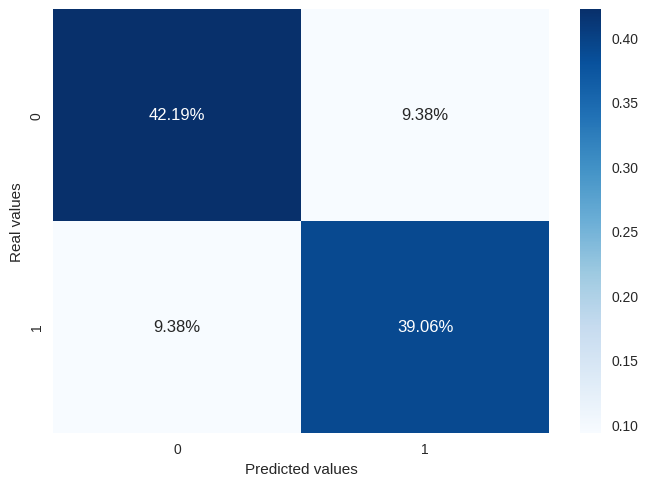

In [ ]:
matrixrf = confusion_matrix(predict_Yrf, test_Y)
ax = sns.heatmap(matrixrf/np.sum(matrixrf), annot=True, fmt='.2%', cmap='Blues')
ax.set_xlabel('Predicted values')
ax.set_ylabel('Real values')

**Conclusión a partir de los resultados de Random Forest**

De acuerdo a los resultados, el algoritmo presenta un F1-score de $0.82$ para la $clase 0$ y de $0.81$ para la $clase 1$. Estas clases indican la presencia o no de cálculos biliares.

Los scores obtenidos, muestran un rendimiento mucho más preciso comparado con el modelo anterior con el dataset utilizado, ya que muestran un valor ligeramente superior a $0.80$ esperado para la generalización del modelo.

## 5. Conclusiones finales

- A través de este proyecto se ha podido integrar los conocimientos sobre algoritmos no supervisados como **K-Means y DBSCAN** para la obtención de grupos o categorías presentes en el dataset original.

- Además se ha realizado los procesos relacionados con *feature engineering* para la limpieza de datos, análisis de correlación y multicolinealidad. Esto con la finalidad de seleccionar los mejorar parámetros predictivos para el entrenamiento de un algoritmo de Machine Learning.

- Los algoritmos supervisado para clasificación utilizados son **Arboles de decisión y Random Forest**, que han sido entrenados considerando la librería *RandomizedSearchCV* para la optimización de parámetros y obtener el mejor modelo para cada caso.

- Los resultados tanto de los algoritmos no supervisados como de los supervisados muestran una precisión adecuada para el entendimiento de la información así como para la generalización de los modelos.

## 6. Bibliografía

 - Bishop, C. M. (2006). Pattern recognition and machine learning. Springer.

 - Géron, A. (2022). Hands-on machine learning with Scikit-Learn, Keras, and TensorFlow: Concepts, tools, and techniques to build intelligent systems (3rd ed.). O'Reilly Media. Puedes revisar detalles y capítulos en la Biblioteca de O'Reilly.

 - Hastie, T., Tibshirani, R., & Friedman, J. (2009). The elements of statistical learning: Data mining, inference, and prediction (2nd ed.). Springer.

 - James, G., Witten, D., Hastie, T., & Tibshirani, R. (2021). An introduction to statistical learning: With applications in R (2nd ed.). Springer.

 - Murphy, K. P. (2012). Machine learning: A probabilistic perspective. MIT Press.

## 6.1 Uso de IA

Se ha utilizado IA de manera general para consultas específicas, **NO** para creación de código ni solucionar el trabajo de forma parcial o total.